# Семинар по OpenCV | Домашнее задание 2

**Задачи:**

1. Поработать с цветовым пространством HSV: используя модель HSV, попробовать еще раз выполнить задание по превращению "starry_night" в "starry_day" (из ДЗ №1).

2. Сделать размытое на занятии изображение чётким.

**Данные:** изображение `../data/starry_night.jpg`

---

Импорт библиотек:

In [1]:
import numpy as np
import cv2 as cv

from typing import List, Tuple, Dict

import matplotlib.pyplot as plt

Задание пути до изображения:

In [2]:
PATH = '../data/starry_night.jpg'

Чтение изображения с конвертацией цветов:

In [3]:
image = cv.imread(PATH, )
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

Выведение на экран изображения:

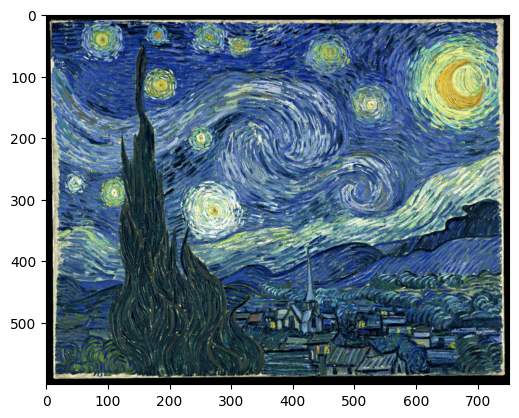

In [4]:
plt.imshow(image)

---

>**Задание 1**
>
> Используя модель HSV, попробовать еще раз выполнить задание по превращению "starry_night" в "starry_day" (из ДЗ №1).
>
>*С помощью модели HSV легче описывать цвет, который мы хотим получить. Поскольку здесь мы оперируем понятиями H = Hue = оттенок, S = Saturation = насыщенность, V = Value = яркость.*

Задание функции, выводящей изображение до и после преобразования:

In [13]:
def plot_image_before_after(img_before: np.ndarray, 
                            img_after: np.ndarray,
                            titles: List[str] = ['Starry night', 'Starry day']) -> None:
    
    fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(12, 6))
    title_before, title_after = titles
    
    ax1.imshow(img_before)
    ax1.set_title(title_before)
    
    ax2.imshow(img_after)
    ax2.set_title(title_after)
    
    plt.xticks([])
    plt.yticks([])
    plt.show()

Задание функции, выводящей HSV модель изображения:

In [6]:
def plot_image_hsv(hsv: Tuple[np.ndarray]) -> None:
    plt.figure(figsize=(12, 6))
    
    h, s, v = hsv
    
    plt.subplot(131)
    plt.imshow(h, vmin=0, vmax=255)
    plt.title('H')
    
    plt.subplot(132)
    plt.imshow(s, vmin=0, vmax=255)
    plt.title('S')
    
    plt.subplot(133)
    plt.imshow(v, vmin=0, vmax=255)
    plt.title('V')

    plt.show()

Получение HSV модели изображения:

In [7]:
image_hsv = cv.cvtColor(image, cv.COLOR_RGB2HSV)

Выведение на экран HSV модели изображения:

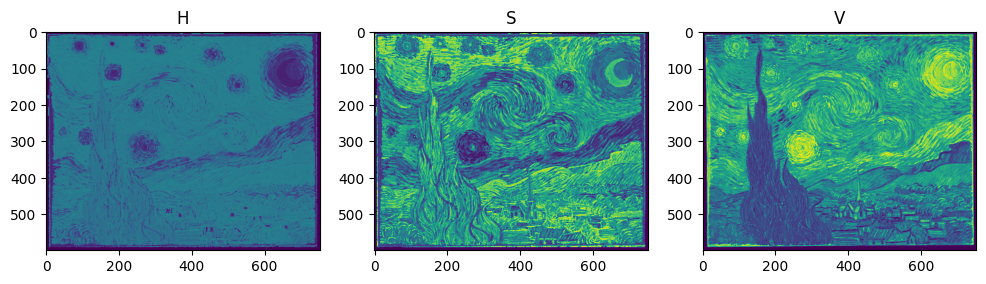

In [8]:
plot_image_hsv(cv.split(image_hsv))

Задание функции, преобразующей модель HSV изображения:

In [9]:
def convert_brightness(hsv: Tuple[np.ndarray], value: int, threshold: int = 255) -> np.ndarray:
    h, s, v = hsv

    lim = threshold - value
    v[v > lim] = threshold
    v[v <= lim] += value

    final_hsv = cv.merge((h, s, v))
    
    return cv.cvtColor(final_hsv, cv.COLOR_HSV2RGB)

Выведение на экран изображения до и после преобразования:

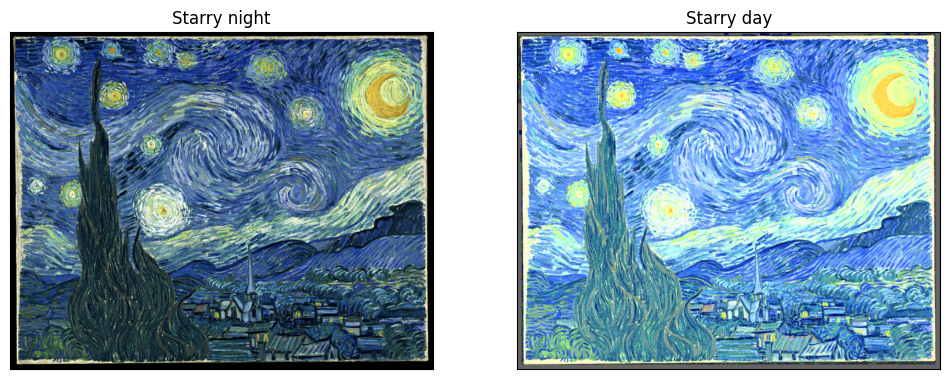

In [10]:
plot_image_before_after(image, (convert_brightness(cv.split(image_hsv), 100)))

---

>**Задание 2**
>
>На занятии мы разобрали несколько подходов для того, чтобы "размыть" изображение. Для этого мы использовали фильтры, представленные различными матрицами (ядрами). Вопрос - как нам решить обратную задачу? Т.е., имея размытое изображение, как сделать его более четким? Подобрать матрицу, которая может это сделать.

Задание функции, выводящей применение разных ядер к изображению:

In [11]:
def plot_filtered_images(img: np.ndarray,
                         filter2D_kernel: np.ndarray,
                         blur_kernel: Tuple[int],
                         gaussian_blur_kernel: Tuple[int],
                         bilateral_filter: Tuple[int],
                         median_blur_kernel: int,
                         return_filters: bool = True) -> None or Dict[str, np.ndarray]:
    
    kernel = np.ones((20, 20), np.float32) * 1/400

    filters = {
        'init': img,
        f'filter2D': cv.filter2D(img, -1, filter2D_kernel),
        f'blur {blur_kernel}': cv.blur(img, blur_kernel),
        f'GaussianBlur {gaussian_blur_kernel}': cv.GaussianBlur(img, gaussian_blur_kernel, 0),
        f'bilateralFilter {bilateral_filter}': cv.bilateralFilter(img, *bilateral_filter),
        f'medianBlur {median_blur_kernel}': cv.medianBlur(img, median_blur_kernel)
    }
    
    n_cols = 2
    n_rows = len(filters) // n_cols + len(filters) % n_cols
    
    fig, ax = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(12, 5 * n_rows))
    
    for ax_i, (name, img_filtered) in zip(ax.flatten(), filters.items()):
        ax_i.set_title(name)
        ax_i.imshow(img_filtered)
    
    if n_rows * n_cols > len(filters):
        fig.delaxes(ax.flatten()[-1])
    
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
    if return_filters:
        return filters

Задание функции, выводящей попарно размытое изображение и результат применения к нему ядра резкости:

In [15]:
def plot_sharpened_blur(imgs: Dict[str, np.ndarray], 
                        filter2D_kernel: np.ndarray) -> None:
    
    for name, img_filtered in imgs.items():
        plot_image_before_after(
            img_filtered,
            cv.filter2D(img_filtered, -1, filter2D_kernel),
            titles=[name, 'sharpened']
        )

<br>

**Размытие изображения**

Выведение на экран результатов применения разных ядер к изображению:

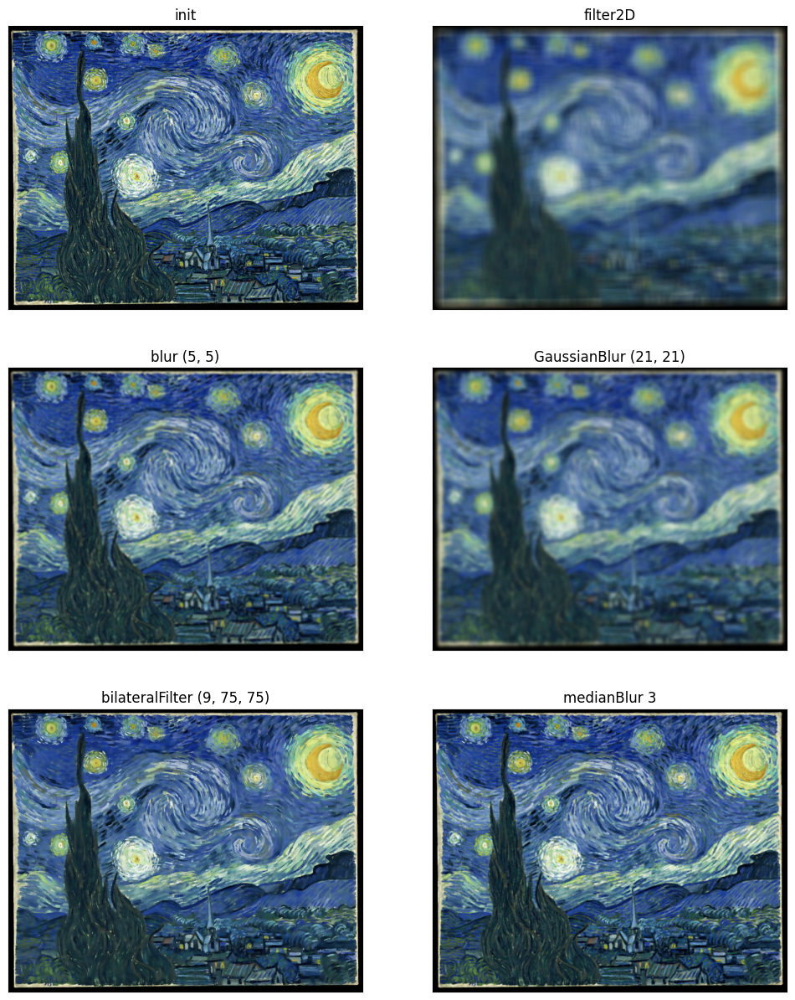

In [14]:
filtered_images = plot_filtered_images(
    image,
    filter2D_kernel=np.ones((20, 20), np.float32) * 1/400,
    blur_kernel=(5, 5),
    gaussian_blur_kernel=(21, 21),
    bilateral_filter=(9, 75, 75),
    median_blur_kernel=3
)

<br>

**Увеличение резкости размытого изображения**

**Ядро 1**

```
kernel = [
    [-1, -1, -1], 
    [-1, 9, -1], 
    [-1, -1, -1]
]
```

Выведение на экран применения ядра с настройкой резкости к размытым изображениям:

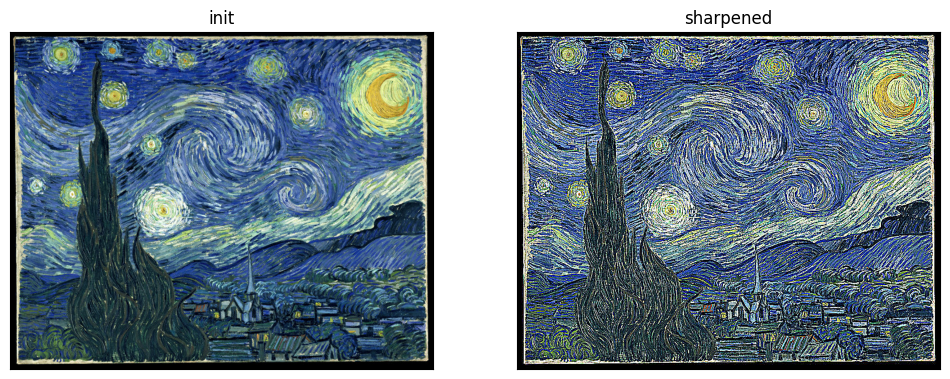

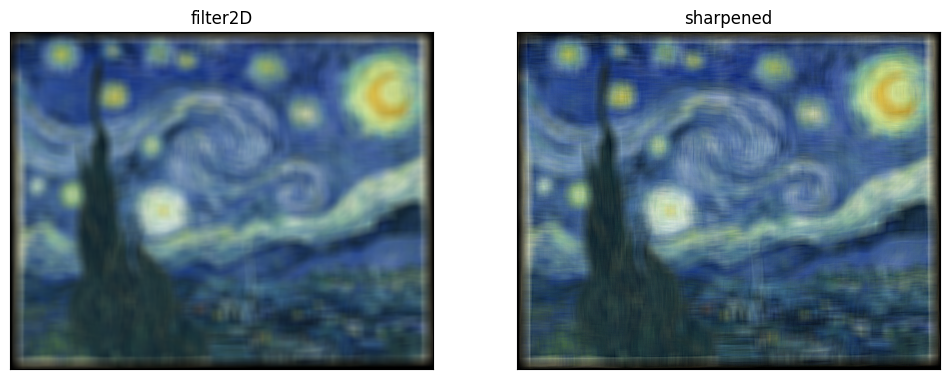

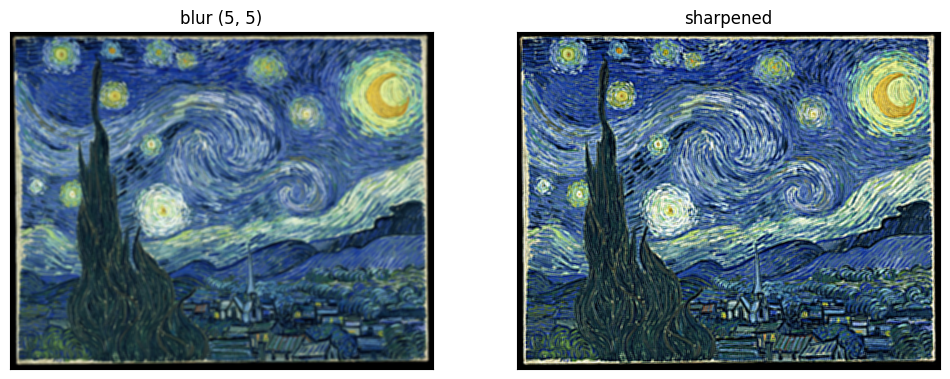

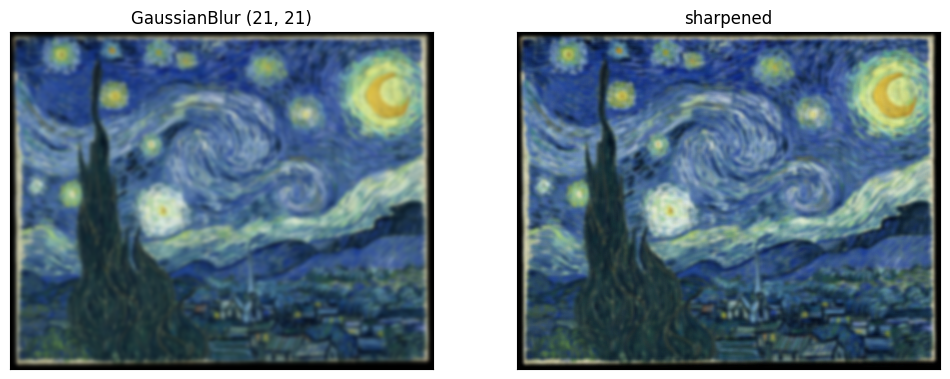

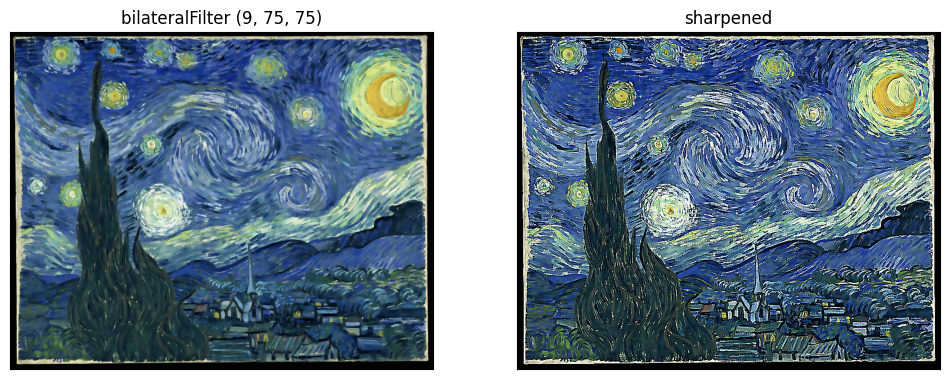

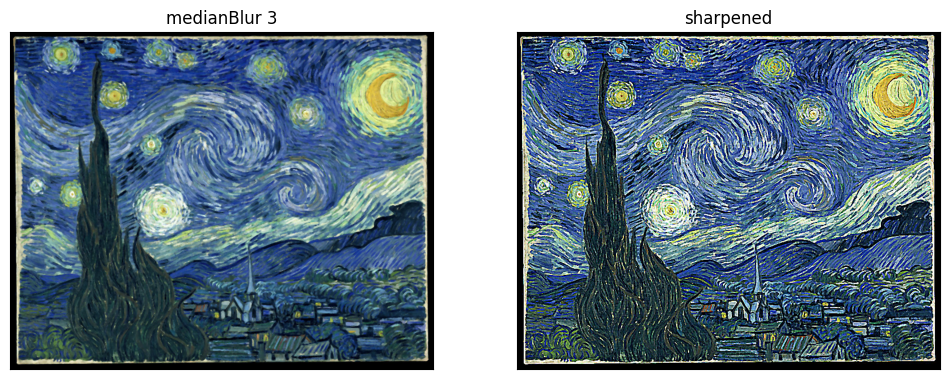

In [115]:
plot_sharpened_blur(
    filtered_images,
    np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
)

>На размытые с помощью `filter2D` и `GaussianBlur (21, 21)` изображения применённое настраивающее резкость ядро не оказало влияния.

**Ядро 2**

```
kernel = [
    [0, -1, 0], 
    [-1, 5, -1], 
    [0, -1, 0]
]
```

Выведение на экран применения ядра с настройкой резкости к размытым изображениям:

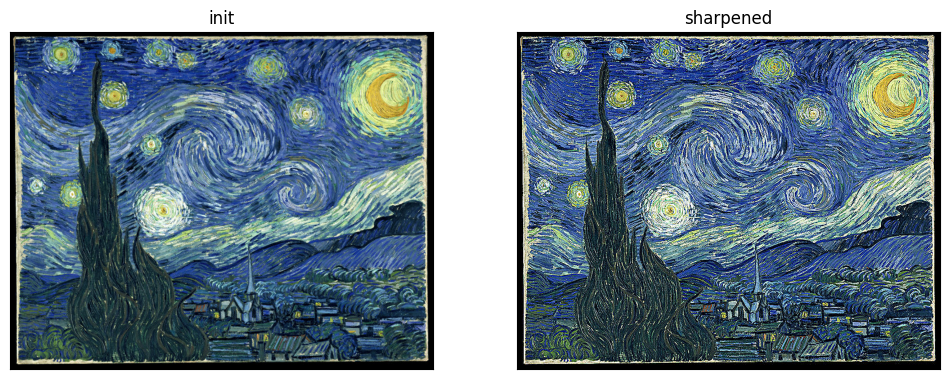

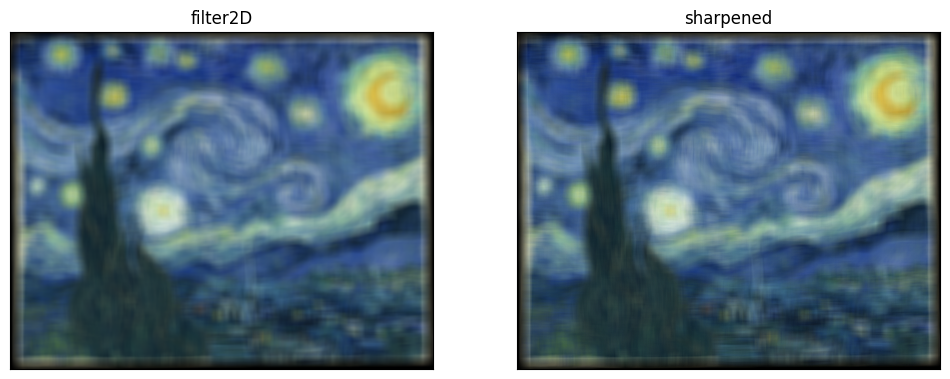

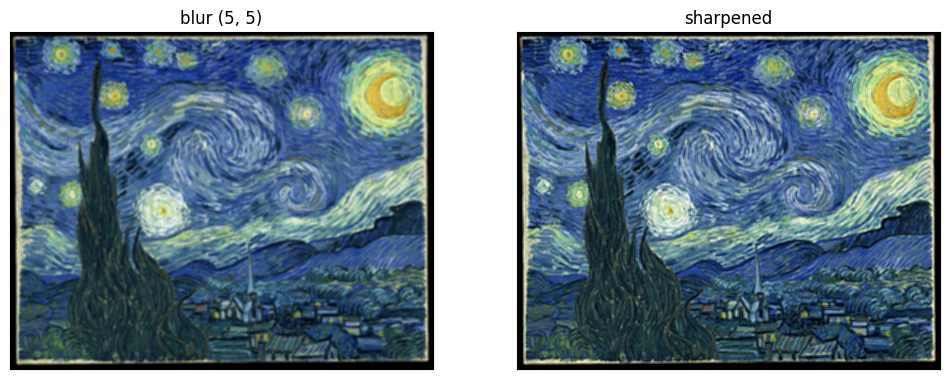

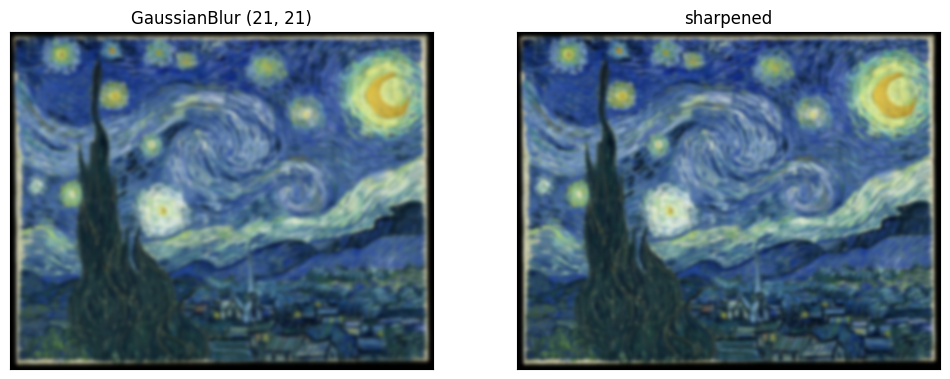

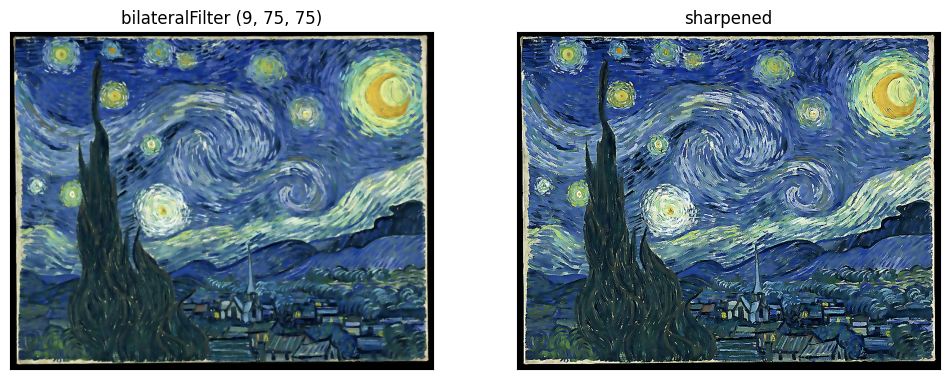

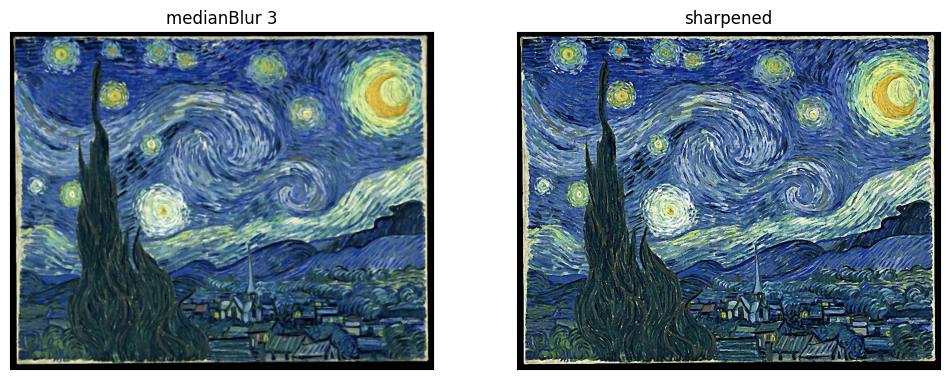

In [17]:
plot_sharpened_blur(
    filtered_images,
    np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
)

>На размытые с помощью `filter2D` и `GaussianBlur (21, 21)` изображения применённое настраивающее резкость ядро не оказало влияния.

**Ядро 3**

```
kernel = [
    [0, -1, 0], 
    [-1, 5, -1], 
    [0, -1, 0]
]
```

Выведение на экран применения ядра с настройкой резкости к размытым изображениям:

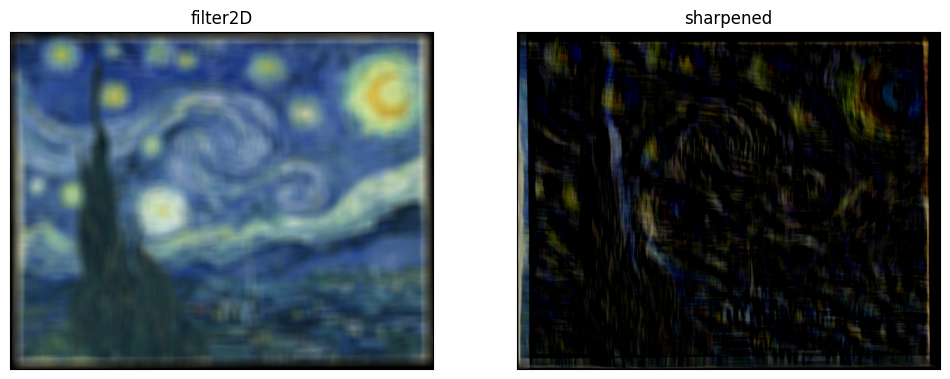

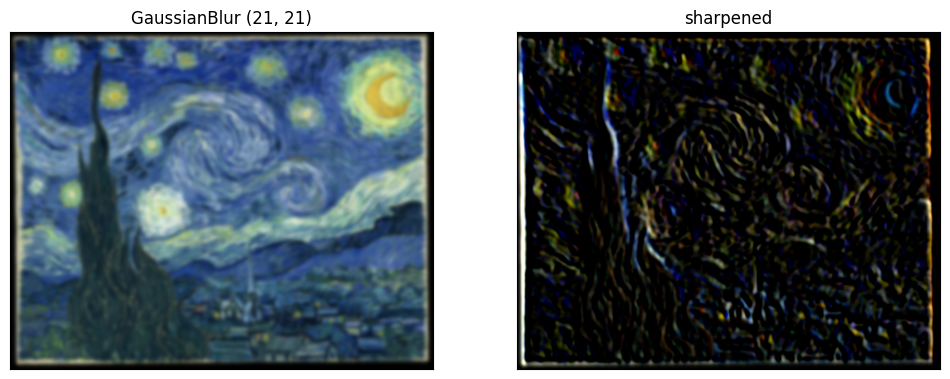

In [215]:
plot_sharpened_blur(
    {
        'filter2D': filtered_images['filter2D'],
        'GaussianBlur (21, 21)': filtered_images['GaussianBlur (21, 21)']
    },
    np.array([[-4, 0, 4], [-3, 5, 3], [-3, 0, -2]])
)

<div style="text-align: center; font-size: 20px; padding: 15px 0;">
    <a href="#Семинар-по-OpenCV-|-Домашнее-задание-2" data-toc-modified-id="Наверх" style="text-decoration: none; color: #296eaa; border: 2px dashed #296eaa; opacity: 0.8; border-radius: 3px; padding: 10px 80px;">
        Наверх ↑
    </a>
</div>